In [7]:
import pandas as pd
import requests
from selenium import webdriver
from bs4 import BeautifulSoup as bs
import time
time.sleep(.3)
from tqdm import tqdm
import chromedriver_binary 

In [8]:
link = 'https://www.magicbricks.com/property-for-sale/residential-real-estate?bedroom=3,4,2&proptype=Multistorey-Apartment,Builder-Floor-Apartment,Penthouse,Studio-Apartment&Locality=Bandra&cityName=Mumbai&BudgetMin=60-Lacs&BudgetMax=10-Crores'

In [9]:
driver = webdriver.Chrome( )

In [10]:
driver.get(link )

In [11]:
driver.encoding = 'utf-8'  # Set encoding to utf-8

## - PERFORMED INFINITE SCROLLING HERE

In [13]:
# INFINITE SCROLLING 
# for i in tqdm(range(0,540000,1000)):
# 	driver.execute_script("window.scrollTo(0," + str(i) + ")")
# 	time.sleep(.3)

from selenium.common.exceptions import NoSuchElementException

try:
    max_attempts = 5  # Maximum retries to check for new content
    attempts = 0  # Counter for failed attempts to load new content
    previous_height = driver.execute_script("return document.body.scrollHeight")

    while attempts < max_attempts:
        # Scroll down to the bottom of the page
        driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
        time.sleep(2)  # Wait for new content to load

        # Check if new content has loaded by comparing the page height
        current_height = driver.execute_script("return document.body.scrollHeight")
        if current_height == previous_height:
            attempts += 1  # Increment the failed attempts counter
            print(f"No new content. Attempt {attempts}/{max_attempts}")
        else:
            attempts = 0  # Reset the counter if new content is loaded
            previous_height = current_height  # Update the height

    print("Reached the end of the page or no more content is loading.")

except Exception as e:
    print(f"An error occurred during scrolling: {e}")


No new content. Attempt 1/5
No new content. Attempt 2/5
No new content. Attempt 1/5
No new content. Attempt 1/5
No new content. Attempt 1/5
No new content. Attempt 2/5
No new content. Attempt 3/5
No new content. Attempt 4/5
No new content. Attempt 5/5
Reached the end of the page or no more content is loading.


In [14]:
soup = bs(driver.page_source,'html.parser')

<html lang="en">
 <head>
  <meta charset="utf-8"/>
  <meta content="IE=edge,chrome=1" http-equiv="X-UA-Compatible"/>
  <meta content="width=device-width, initial-scale=1" name="viewport"/>
  <title>
  </title>
  <link href="https://fonts.gstatic.com" rel="dns-prefetch"/>
  <link href="https://cdn.staticmb.com" rel="preconnect"/>
  <link href="https://img.staticmb.com" rel="preconnect"/>
  <link href="https://www.googletagmanager.com" rel="dns-prefetch"/>
  <link href="https://www.google-analytics.com" rel="dns-prefetch"/>
  <link href="https://cdn.staticmb.com/images/favicon.ico" rel="shortcut icon"/>
  <meta content="" name="description"/>
  <meta content="" name="keywords"/>
  <link as="image" fetchpriority="high" href="https://img.staticmb.com/mbphoto/property/cropped_images/2023/Apr/03/Photo_h300_w450/66385689_11_hatsAppImage20230303at19.39.20_300_450.jpeg" rel="preload"/>
  <link as="image" href="https://img.staticmb.com/mbphoto/property/cropped_images/2024/Jul/25/Photo_h300_w450/
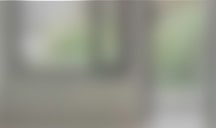
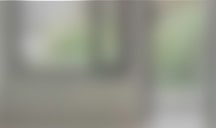

In [15]:
print(soup.prettify())

In [16]:
sp = soup.find('div', attrs={'id': 'body'}) 
       
# Extracting head titles with a condition for missing elements
head_elements = sp.find_all('h2', attrs={'class': 'mb-srp__card--title'})
head_titles = [
    head.text.strip() if head else None
    for head in head_elements
]
# ====================================================================================================================================
card_container = sp.find_all('div', attrs={'class': 'mb-srp__card__container'})

# Extracting society names with a condition for missing elements
society_name = [
    container.find('div', attrs={'class': 'mb-srp__card__society'}).text.strip() if container.find('div', attrs={'class': 'mb-srp__card__society'}) else None
    for container in card_container
]

# ====================================================================================================================================
# Iterate through each card_container and find the names within each, adding None if not found
agent_owner = [
    i.find('div', attrs={'class': 'mb-srp__card__ads--name'}).text.strip() if i.find('div', attrs={'class': 'mb-srp__card__ads--name'}) else None
    for i in card_container
]

# ====================================================================================================================================
area = [
    aa.find('div', attrs={'class': 'mb-srp__card__summary--label'}).text.strip() if aa.find('div', attrs={'class': 'mb-srp__card__summary--label'}) else None
    for aa in card_container
]

# ====================================================================================================================================
sqft = [
    sq.find('div', attrs={'class': 'mb-srp__card__summary--value'}).text.strip() if sq.find('div', attrs={'class': 'mb-srp__card__summary--value'}) else None
    for sq in card_container
]

# ====================================================================================================================================
# Find all divs with class 'mb-srp__card__summary__list'
small_container = sp.find_all('div', attrs={'class': 'mb-srp__card__summary__list'})

# Extract the furnishing information
furnished_value = [
    sq.find('div', attrs={'data-summary': 'furnishing'}).find('div', attrs={'class': 'mb-srp__card__summary--value'}).text.strip() 
    if sq.find('div', attrs={'data-summary': 'furnishing'}) else None
    for sq in small_container
]

# ====================================================================================================================================

# Find all divs with class 'mb-srp__card__price--amount'
price_elements = sp.find_all('div', attrs={'class': 'mb-srp__card__price--amount'})

# Extracting the price text by removing the rupees span
prices = [
    price.get_text(strip=True).replace('₹', '').strip()  # Remove '₹' and extra spaces
    for price in price_elements
]
# ====================================================================================================================================
# Find all divs with class 'mb-srp__card--desc--text'
desc_elements = sp.find_all('div', attrs={'class': 'mb-srp__card'})

# Extract text from the <p> tag with explicit check for missing or empty <p> tags
description_text = [
    container.find('p').text.strip() if container.find('p') and container.find('p').text.strip() else None
    for container in desc_elements
]

# ====================================================================================================================================
 
square = sp.find_all('div', attrs={'class': 'mb-srp__card'})

# Extract text from the div with class 'mb-srp__card__price--size'
per_sqft = [
    container.find('div', attrs={'class': 'mb-srp__card__price--size'}).text.strip() 
    if container.find('div', attrs={'class': 'mb-srp__card__price--size'}) and container.find('div', attrs={'class': 'mb-srp__card__price--size'}).text.strip() 
    else None
    for container in square
]
# print(len(per_sqft))  # Check the first 10 entries


# ====================================================================================================================================
small_container = sp.find_all('div', attrs={'class': 'mb-srp__card__summary__list'})
# Extract the furnishing information
transaction = [
    sq.find('div', attrs={'data-summary': 'transaction'}).find('div', attrs={'class': 'mb-srp__card__summary--value'}).text.strip() 
    if sq.find('div', attrs={'data-summary': 'transaction'}) else None
    for sq in small_container
]
len(transaction)
 
 

1063

In [17]:
df=pd.DataFrame(columns=['title'])

In [18]:
df

,title


In [19]:
df['title']=head_titles

In [20]:
df['society_name']=society_name

In [21]:
df['agent_owner']=agent_owner

In [22]:
df['per_sqft_price']=per_sqft

In [23]:
df['price'] = prices

In [24]:
df['carpet_super_area'] = area

In [25]:
df['sqft']=sqft

In [26]:
df['transaction']=transaction

In [27]:
df['furnishing']=furnished_value

In [28]:
df['description'] = description_text

In [29]:
df.to_csv('Magicbricks_1171.csv',index=False)

In [30]:
df.to_excel('Magicbricks_1171_excel_main.xlsx',index=False)